In [1]:
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd
import matplotlib
matplotlib.rcParams.update({'font.size': 12})
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV


In [2]:
# import data
treasury_df = pd.read_csv('Treasury yield curve data.csv', sep = ',')

In [3]:
treasury_df.shape

(8071, 32)

In [4]:
treasury_df.dtypes

Date          object
SVENF01      float64
SVENF02      float64
SVENF03      float64
SVENF04      float64
SVENF05      float64
SVENF06      float64
SVENF07      float64
SVENF08      float64
SVENF09      float64
SVENF10      float64
SVENF11      float64
SVENF12      float64
SVENF13      float64
SVENF14      float64
SVENF15      float64
SVENF16      float64
SVENF17      float64
SVENF18      float64
SVENF19      float64
SVENF20      float64
SVENF21      float64
SVENF22      float64
SVENF23      float64
SVENF24      float64
SVENF25      float64
SVENF26      float64
SVENF27      float64
SVENF28      float64
SVENF29      float64
SVENF30      float64
Adj_Close    float64
dtype: object

In [5]:
treasury_df.info

<bound method DataFrame.info of            Date  SVENF01  SVENF02  SVENF03  SVENF04  SVENF05  SVENF06  \
0     5/17/2019   2.1224   2.0266   2.1023   2.2377   2.3790   2.5042   
1     5/16/2019   2.1239   2.0317   2.1096   2.2468   2.3901   2.5171   
2     5/15/2019   2.0874   1.9956   2.0844   2.2289   2.3736   2.4980   
3     5/14/2019   2.1319   2.0559   2.1451   2.2856   2.4257   2.5461   
4     5/13/2019   2.1051   2.0234   2.1180   2.2632   2.4051   2.5248   
...         ...      ...      ...      ...      ...      ...      ...   
8066  1/20/1987   6.1632   6.6192   6.9560   7.2403   7.4888   7.7032   
8067  1/16/1987   6.2091   6.6589   6.9843   7.2634   7.5140   7.7355   
8068  1/15/1987   6.2195   6.6790   7.0240   7.3172   7.5738   7.7951   
8069  1/14/1987   6.2215   6.6978   7.0637   7.3688   7.6270   7.8421   
8070  1/13/1987   6.2102   6.6709   7.0310   7.3333   7.5890   7.8010   

      SVENF07  SVENF08  SVENF09  ...  SVENF22  SVENF23  SVENF24  SVENF25  \
0      2.6069  

In [6]:
treasury_df.head()

,Date,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
0,5/17/2019,2.1224,2.0266,2.1023,2.2377,2.3790,2.5042,2.6069,2.6885,2.7530,...,3.3355,3.3876,3.4400,3.4925,3.5446,3.5962,3.6471,3.6970,3.7458,10.130177
1,5/16/2019,2.1239,2.0317,2.1096,2.2468,2.3901,2.5171,2.6217,2.7049,2.7710,...,3.3574,3.4091,3.4610,3.5130,3.5646,3.6156,3.6660,3.7153,3.7636,10.130177
2,5/15/2019,2.0874,1.9956,2.0844,2.2289,2.3736,2.4980,2.5984,2.6779,2.7418,...,3.3589,3.4086,3.4575,3.5055,3.5524,3.5980,3.6421,3.6847,3.7257,10.150118
3,5/14/2019,2.1319,2.0559,2.1451,2.2856,2.4257,2.5461,2.6428,2.7188,2.7791,...,3.3940,3.4485,3.5029,3.5568,3.6099,3.6622,3.7132,3.7630,3.8113,10.130177
4,5/13/2019,2.1051,2.0234,2.1180,2.2632,2.4051,2.5248,2.6198,2.6940,2.7532,...,3.3712,3.4227,3.4735,3.5234,3.5722,3.6196,3.6655,3.7098,3.7525,10.130177


In [7]:
treasury_df.describe()

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
count,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,...,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000
mean,3.785311,4.258972,4.669363,5.022430,5.318493,5.559644,5.750071,5.895135,6.000596,6.072112,...,5.689046,5.621666,5.554136,5.486943,5.420479,5.355063,5.290948,5.228333,5.167371,5.509793
std,2.648060,2.498137,2.341348,2.221632,2.137801,2.080405,2.040337,2.010786,1.987244,1.966960,...,1.801291,1.797858,1.797012,1.798842,1.803390,1.810643,1.820541,1.832984,1.847834,2.491110
min,0.072700,0.327300,0.630300,1.013000,1.424500,1.698200,1.807300,1.885000,1.942100,1.988200,...,1.489600,1.283000,1.100800,0.941000,0.801800,0.681200,0.577100,0.487600,0.411100,2.801050
25%,1.144050,1.865600,2.536550,3.023050,3.544700,4.063300,4.409750,4.644300,4.774550,4.859500,...,4.177450,4.090550,4.024800,3.982950,3.962100,3.887150,3.840900,3.825050,3.831350,3.130587
50%,3.986500,4.393300,4.505500,4.718900,5.051300,5.394600,5.663700,5.870800,5.993700,6.082400,...,5.619600,5.503000,5.369900,5.228000,5.096700,4.979700,4.860800,4.758600,4.669000,4.956219
75%,5.901500,6.221250,6.461300,6.626600,6.779550,6.908050,7.049900,7.181600,7.297550,7.393350,...,7.330550,7.233200,7.114900,6.998150,6.871050,6.765400,6.650600,6.535450,6.421850,8.051437
max,9.813800,9.887800,10.145600,10.459900,10.649900,10.741400,10.766300,10.747500,10.701500,10.640000,...,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.150118


# Exploratory Data Analysis (EDA)

## Scatterplot matrix

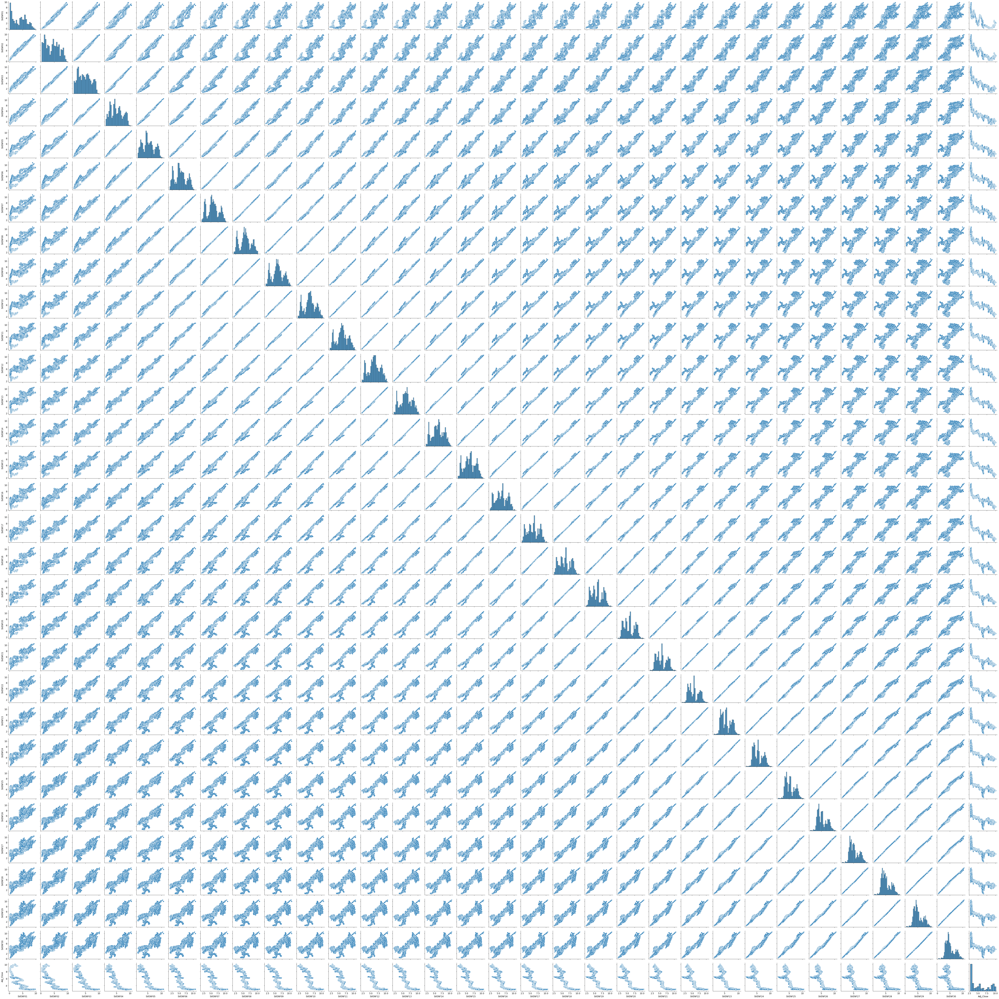

In [8]:
sns.pairplot(treasury_df, size=2.5)
plt.tight_layout()
plt.show()

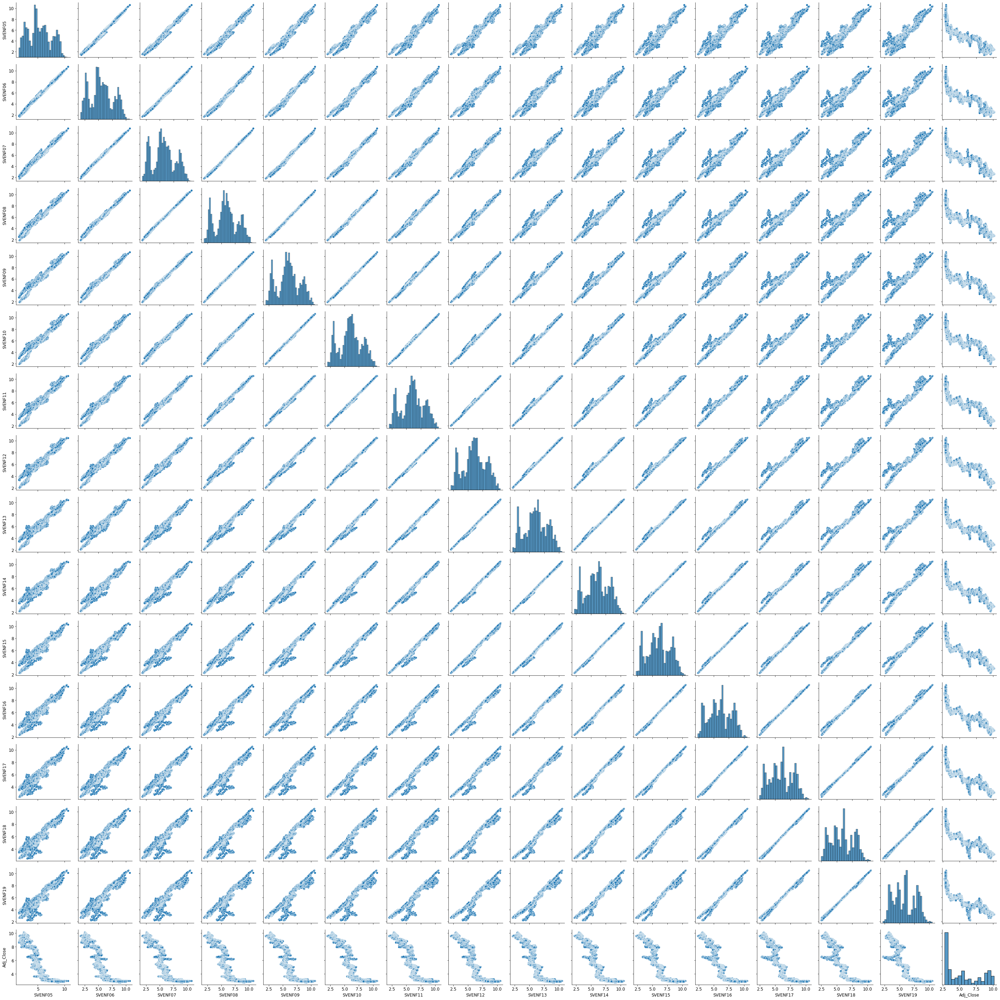

In [9]:
cols = ['SVENF05', 'SVENF06', 'SVENF07', 'SVENF08', 'SVENF09', 'SVENF10', 'SVENF11', 'SVENF12', 'SVENF13', 'SVENF14', 'SVENF15', 'SVENF16', 'SVENF17', 'SVENF18', 'SVENF19', 'Adj_Close']
sns.pairplot(treasury_df[cols], size=2.5)
plt.tight_layout()
plt.show()

## Histogram

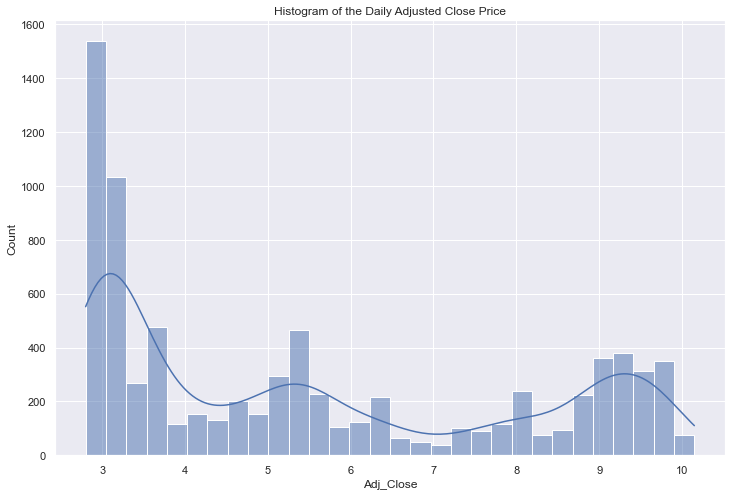

In [10]:
sns.set(rc={'figure.figsize':(12,8)})
sns.histplot(treasury_df['Adj_Close'], bins = 30, kde = True)
plt.title("Histogram of the Daily Adjusted Close Price")
plt.show()


## Q-Q Plot

8071


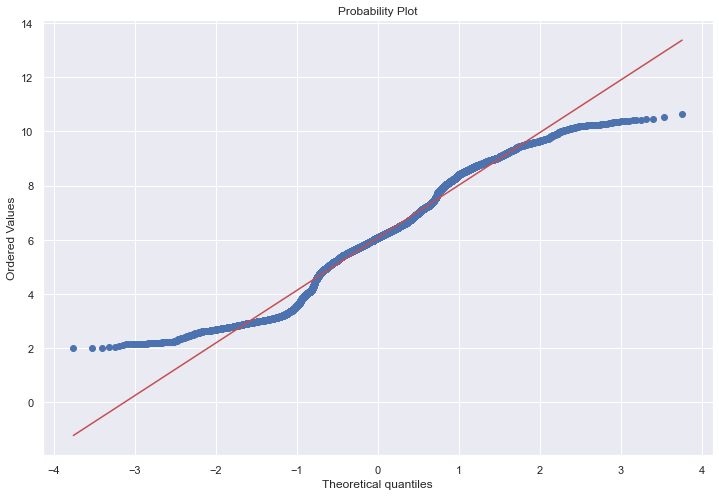

In [11]:
import scipy.stats as stats
import pylab

arr = treasury_df.to_numpy()
print(len(arr))
l= len(arr)
k=[]
for i in range(l):
    kk=arr[i][10] 
    k.append(kk)
#print(k)
#measurements = np.random.normal(loc = 20, scale = 5, size=100)   
k=np.array(k)
stats.probplot(k, dist="norm", plot=pylab)
pylab.show()

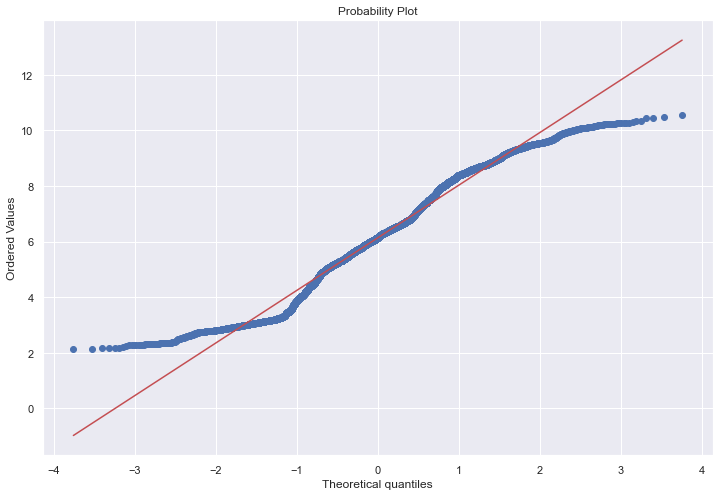

In [12]:
k=[]
for i in range(l):
    kk=arr[i][13] 
    k.append(kk)
#print(k)
#measurements = np.random.normal(loc = 20, scale = 5, size=100)   
k=np.array(k)
stats.probplot(k, dist="norm", plot=pylab)
pylab.show()

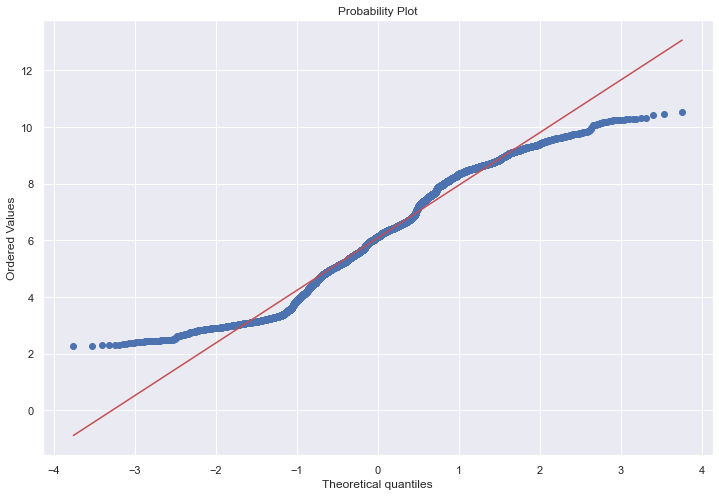

In [13]:
k=[]
for i in range(l):
    kk=arr[i][15] 
    k.append(kk)
#print(k)
#measurements = np.random.normal(loc = 20, scale = 5, size=100)   
k=np.array(k)
stats.probplot(k, dist="norm", plot=pylab)
pylab.show()

In [14]:
summary=treasury_df.describe()
print(summary)

           SVENF01      SVENF02      SVENF03      SVENF04      SVENF05  \
count  8071.000000  8071.000000  8071.000000  8071.000000  8071.000000   
mean      3.785311     4.258972     4.669363     5.022430     5.318493   
std       2.648060     2.498137     2.341348     2.221632     2.137801   
min       0.072700     0.327300     0.630300     1.013000     1.424500   
25%       1.144050     1.865600     2.536550     3.023050     3.544700   
50%       3.986500     4.393300     4.505500     4.718900     5.051300   
75%       5.901500     6.221250     6.461300     6.626600     6.779550   
max       9.813800     9.887800    10.145600    10.459900    10.649900   

           SVENF06      SVENF07      SVENF08      SVENF09      SVENF10  ...  \
count  8071.000000  8071.000000  8071.000000  8071.000000  8071.000000  ...   
mean      5.559644     5.750071     5.895135     6.000596     6.072112  ...   
std       2.080405     2.040337     2.010786     1.987244     1.966960  ...   
min       1.69820

## HeatMap

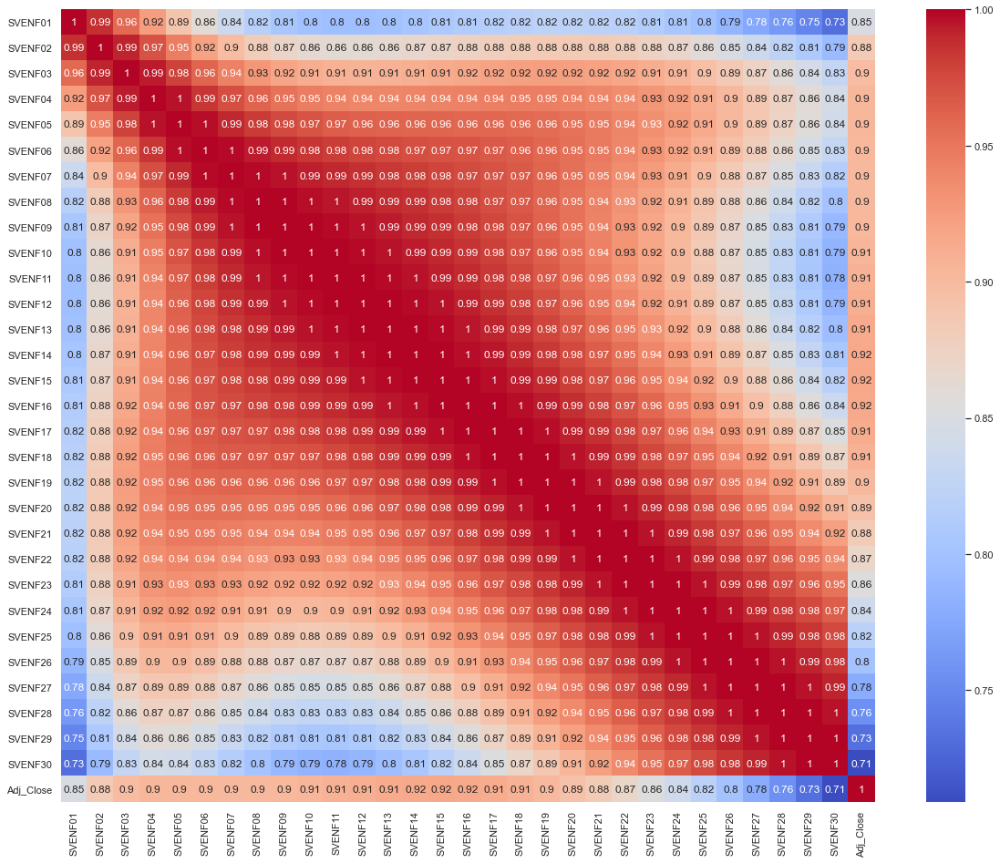

In [15]:
# Plot the absolute value of the corr heatmap
corr_matrix = treasury_df.corr().abs()
plt.figure(figsize = (20,16))
sns.heatmap(corr_matrix, annot = True, cmap = 'coolwarm')
plt.show()

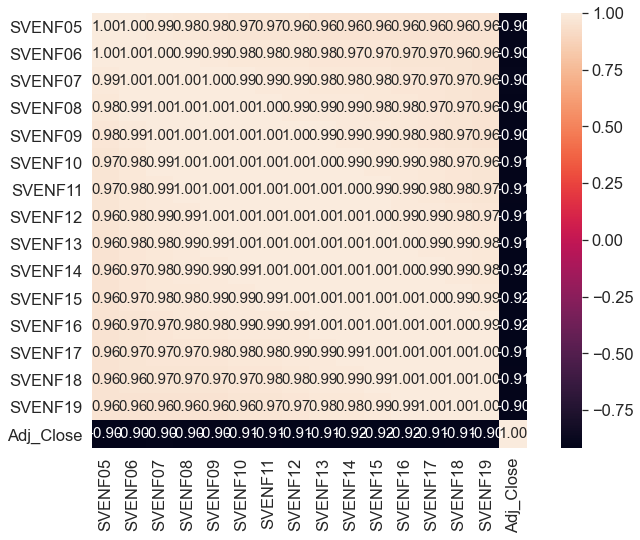

In [16]:
cm = np.corrcoef(treasury_df[cols].values.T)
sns.set(font_scale=1.5)
hm = sns.heatmap(cm,
                cbar=True,
                annot=True,
                square=True,
                fmt='.2f',
                annot_kws={'size':15},
                yticklabels=cols,
                xticklabels=cols)
plt.show()

# variables 'SVENF03', 'SVENF04','SVENF05', 'SVENF06', 'SVENF07', 'SVENF08', 'SVENF09', 'SVENF10', 'SVENF11', 'SVENF12', 'SVENF13', 'SVENF14', 'SVENF15', 'SVENF16', 'SVENF17', 'SVENF18', 'SVENF19 stayed in the model 

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
corr = treasury_df.corr(method='pearson')
print(corr)

            SVENF01   SVENF02   SVENF03   SVENF04   SVENF05   SVENF06  \
SVENF01    1.000000  0.986417  0.958364  0.924637  0.890691  0.860385   
SVENF02    0.986417  1.000000  0.991325  0.971026  0.945906  0.920994   
SVENF03    0.958364  0.991325  1.000000  0.993681  0.978891  0.960996   
SVENF04    0.924637  0.971026  0.993681  1.000000  0.995480  0.985206   
SVENF05    0.890691  0.945906  0.978891  0.995480  1.000000  0.996934   
SVENF06    0.860385  0.920994  0.960996  0.985206  0.996934  1.000000   
SVENF07    0.835864  0.899469  0.943810  0.973186  0.990180  0.998022   
SVENF08    0.817792  0.882818  0.929497  0.962005  0.982494  0.993749   
SVENF09    0.805833  0.871309  0.918916  0.952978  0.975478  0.988922   
SVENF10    0.799116  0.864483  0.912072  0.946523  0.969858  0.984458   
SVENF11    0.796574  0.861544  0.908515  0.942527  0.965797  0.980717   
SVENF12    0.797136  0.861591  0.907593  0.940605  0.963147  0.977729   
SVENF13    0.799830  0.863757  0.908612  0.940265  

# Identify X and y

In [18]:
X = treasury_df.iloc[:, 1:-1].values
y = treasury_df.iloc[:, -1].values

# Train_test_split

In [19]:
X_train,X_test,y_train,y_test=train_test_split(X, y, test_size=0.15,random_state=42)

# Standardize the features

In [20]:
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform(X_test)

# PCA Pipeline

In [21]:
pca = PCA()
pipeline = make_pipeline(sc, pca)
pipeline.fit(X_train_std)
X_train_std_features = range(pca.n_components_)

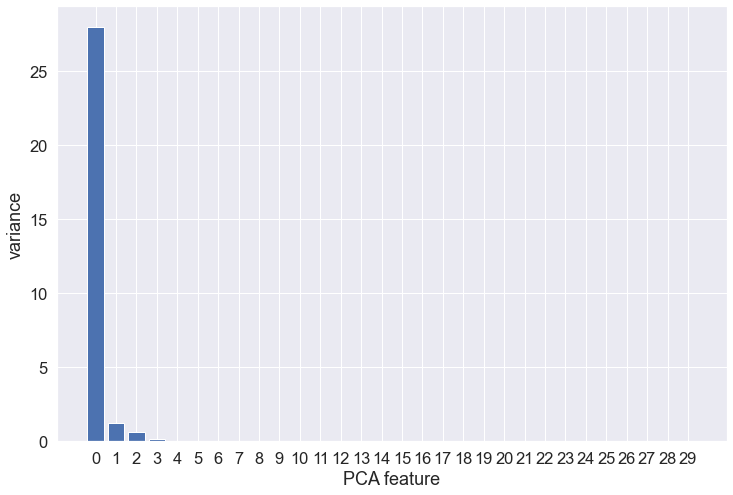

In [22]:
plt.bar(X_train_std_features, pca.explained_variance_)
plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(X_train_std_features)
plt.show()

# PCA features 0, 1 , and 2 have significant variance

# Linear regression

## Original dataset with 30 attributes

# PCA

In [23]:
pca_all_components = PCA(n_components=None)
X_train_std_pca = pca_all_components.fit_transform(X_train_std)
X_test_std_pca = pca_all_components.transform(X_test_std)
print(X_train_std_pca.shape)

(6860, 30)


In [24]:
print(pca_all_components.explained_variance_)

[2.79579848e+01 1.22313057e+00 6.55411544e-01 1.45561136e-01
 1.99031388e-02 2.06243818e-03 2.84492074e-04 3.29679042e-05
 2.55310505e-06 2.02358034e-07 1.41807229e-08 1.14065160e-09
 2.79223423e-10 2.61581550e-10 2.57846271e-10 2.56093108e-10
 2.52582289e-10 2.49758520e-10 2.44978489e-10 2.43769470e-10
 2.38344595e-10 2.35380247e-10 2.31123727e-10 2.26975716e-10
 2.24866474e-10 2.21833200e-10 2.16456124e-10 2.08171004e-10
 1.97434510e-10 1.87834577e-10]


In [25]:
print(pca_all_components.explained_variance_ratio_)

[9.31796975e-01 4.07650756e-02 2.18438668e-02 4.85133058e-03
 6.63341250e-04 6.87379176e-05 9.48168675e-06 1.09876995e-06
 8.50910960e-08 6.74428451e-09 4.72621857e-10 3.80161775e-11
 9.30609065e-12 8.71811396e-12 8.59362280e-12 8.53519254e-12
 8.41818231e-12 8.32407041e-12 8.16475927e-12 8.12446450e-12
 7.94366171e-12 7.84486451e-12 7.70300119e-12 7.56475430e-12
 7.49445649e-12 7.39336209e-12 7.21415235e-12 6.93802195e-12
 6.58019099e-12 6.26023985e-12]


In [26]:
print(pca_all_components.components_)

[[ 1.61888132e-01  1.73172590e-01  1.80115645e-01  1.83862414e-01
   1.85315173e-01  1.85369928e-01  1.84780834e-01  1.84069226e-01
   1.83530551e-01  1.83290955e-01  1.83369514e-01  1.83726228e-01
   1.84293171e-01  1.84992427e-01  1.85745366e-01  1.86477112e-01
   1.87118404e-01  1.87606619e-01  1.87886412e-01  1.87910571e-01
   1.87640756e-01  1.87048547e-01  1.86115918e-01  1.84835758e-01
   1.83211547e-01  1.81256872e-01  1.78994071e-01  1.76452715e-01
   1.73667912e-01  1.70678022e-01]
 [ 8.05192534e-02  6.98007226e-02  7.06463745e-02  8.57101377e-02
   1.10065721e-01  1.37239875e-01  1.62110617e-01  1.81522485e-01
   1.93941058e-01  1.98921453e-01  1.96665270e-01  1.87721187e-01
   1.72801636e-01  1.52673127e-01  1.28099577e-01  9.98100535e-02
   6.84890503e-02  3.47740130e-02 -7.40848409e-04 -3.75011741e-02
  -7.49896321e-02 -1.12722239e-01 -1.50253144e-01 -1.87175041e-01
  -2.23126316e-01 -2.57791855e-01 -2.90911010e-01 -3.22277345e-01
  -3.51737424e-01 -3.79192879e-01]
 [-6.0

# PCA with 3 dimension

In [27]:
pca_3PCs = PCA(n_components=3)
X_train_std_pca_3PCs = pca_3PCs.fit_transform(X_train_std)
X_test_std_pca_3PCs = pca_3PCs.transform(X_test_std)
print(X_train_std_pca_3PCs.shape)
# Reduce the dimensionality from 30 to 3

(6860, 3)


In [28]:
print(pca_3PCs.explained_variance_)

[27.95798476  1.22313057  0.65541154]


In [29]:
print(pca_3PCs.explained_variance_ratio_)

[0.93179697 0.04076508 0.02184387]


In [30]:
print(pca_3PCs.components_)

[[ 0.16188813  0.17317259  0.18011565  0.18386241  0.18531517  0.18536993
   0.18478083  0.18406923  0.18353055  0.18329096  0.18336951  0.18372623
   0.18429317  0.18499243  0.18574537  0.18647711  0.1871184   0.18760662
   0.18788641  0.18791057  0.18764076  0.18704855  0.18611592  0.18483576
   0.18321155  0.18125687  0.17899407  0.17645271  0.17366791  0.17067802]
 [ 0.08051925  0.06980072  0.07064637  0.08571014  0.11006572  0.13723988
   0.16211062  0.18152249  0.19394106  0.19892145  0.19666527  0.18772119
   0.17280164  0.15267313  0.12809958  0.09981005  0.06848905  0.03477401
  -0.00074085 -0.03750117 -0.07498963 -0.11272224 -0.15025314 -0.18717504
  -0.22312632 -0.25779186 -0.29091101 -0.32227734 -0.35173742 -0.37919288]
 [-0.6046661  -0.48260449 -0.35856884 -0.24227314 -0.14040601 -0.05643078
   0.00933964  0.05856422  0.09372729  0.11741487  0.13197071  0.13938601
   0.14129574  0.13902045  0.13361481  0.12591872  0.11659915  0.10618552
   0.09509991  0.08367832  0.0721912

# Linear regression 

## Original dataset with 30 attributes 

In [31]:
lr = LinearRegression()
lr.fit(X_train_std_pca, y_train)

LinearRegression()

In [32]:
lr_train_score=lr.score(X_train_std_pca, y_train)
lr_test_score=lr.score(X_test_std_pca, y_test)
print ("linear regression train score:", lr_train_score)
print ("linear regression test score:", lr_test_score)

linear regression train score: 0.9022730353400192
linear regression test score: 0.9041309535337902


## Model Coefficients

In [33]:
lr_coef=lr.coef_
print ("linear regression coefficients:", lr_coef)

linear regression coefficients: [-4.23644055e-01 -4.86464416e-01  2.65596178e-01  1.00483137e+00
  2.86645852e-01 -4.95838323e-01  6.50853427e+00  2.92188629e+01
  1.11841665e+01  3.44096814e+00  1.29705276e+03  1.15813199e+02
 -1.41391193e+03 -9.65921293e+02  3.40135890e+02  6.68570909e+02
  4.25644260e+02  3.19157005e+02 -3.09703879e+02  1.68660914e+03
 -2.71931150e+02 -3.39159475e+02  6.91989963e+02  1.16007879e+03
  2.08350594e+02  3.31099934e+02 -5.72324343e+02  7.75062855e+02
 -1.26058304e+03  9.03521949e+02]


## y Intercept

In [34]:
lr_intercept=lr.intercept_
print ("linear regression y intercept:", lr_intercept)

linear regression y intercept: 5.498157104373265


## Mean Squared Error (MSE)

In [35]:
# Make predictions using the testing set
lr_y_test_pred = lr.predict(X_test_std_pca)
lr_y_train_pred = lr.predict(X_train_std_pca)

In [36]:
print('Mean squared error: %.2f'
      % mean_squared_error(y_test, lr_y_test_pred))

Mean squared error: 0.61


## R2

In [37]:
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination for test set: %.2f'
      % r2_score(y_test, lr_y_test_pred))
print('Coefficient of determination for train set: %.2f'
      % r2_score(y_train, lr_y_train_pred))

Coefficient of determination for test set: 0.90
Coefficient of determination for train set: 0.90


## PCA transformed dataset with 3 PCs

In [38]:
lr_3PCs = LinearRegression()
lr_3PCs.fit(X_train_std_pca_3PCs, y_train)

LinearRegression()

## Model Coefficients

In [39]:
lr_3PCs_coef=lr_3PCs.coef_
print ("linear regression coefficients:", lr_3PCs_coef)

linear regression coefficients: [-0.42364406 -0.48646442  0.26559618]


## y Intercept

In [40]:
lr_3PCs_intercept=lr_3PCs.intercept_
print ("linear regression y intercept:", lr_3PCs_intercept)

linear regression y intercept: 5.4981571043731785


## Mean Squared Error (MSE)

In [41]:
# Make predictions using the testing set
lr_3PCs_y_test_pred = lr_3PCs.predict(X_test_std_pca_3PCs)
lr_3PCs_y_train_pred = lr_3PCs.predict(X_train_std_pca_3PCs)

In [42]:
print('Mean squared error: %.2f'
      % mean_squared_error(y_test, lr_3PCs_y_test_pred))

Mean squared error: 0.85


## R2

In [43]:
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination for test set: %.2f'
      % r2_score(y_test, lr_3PCs_y_test_pred))

print('Coefficient of determination for train set: %.2f'
      % r2_score(y_train, lr_3PCs_y_train_pred))

Coefficient of determination for test set: 0.87
Coefficient of determination for train set: 0.87


# Support Vector Machine (SVM)

## Original dataset with 30 attributes

## GridSearchCV

In [44]:
#parameters = {'kernel':('linear', 'rbf'),
#              'gamma':[0.1, 0.2, 0.5, 0.8, 1.0,],
#              'C':[1, 5, 10]}
#svm = SVR()
#clf = GridSearchCV(svm, parameters)
#clf.fit(X_train_std_pca, y_train)
#grid_cv = GridSearchCV(estimator=SVR(),
#             param_grid=parameters, 
#             cv=5)
#print("Tuned SVM Parameters: {}".format(grid_cv.best_params_)) 
#print("Best score is {}".format(grid_cv.best_score_))

In [45]:
svm = SVR(kernel='rbf', gamma=0.2, C=1.0)
svm.fit(X_train_std_pca, y_train)

SVR(gamma=0.2)

In [46]:
svm_train_score=svm.score(X_train_std_pca, y_train)
svm_test_score=svm.score(X_test_std_pca, y_test)
print ("SVM svm train score:", svm_train_score)
print ("SVM svm test score:", svm_test_score)

SVM svm train score: 0.9953802445246573
SVM svm test score: 0.9954794397057638


## Mean Squared Error (MSE)

In [47]:
# Make predictions using the testing set
svm_y_test_pred = svm.predict(X_test_std_pca)
svm_y_train_pred = svm.predict(X_train_std_pca)

In [48]:
print('Mean squared error: %.2f'
      % mean_squared_error(y_test, svm_y_test_pred))

Mean squared error: 0.03


## R2

In [49]:
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination for test set: %.2f'
      % r2_score(y_test, svm_y_test_pred))

print('Coefficient of determination for train set: %.2f'
      % r2_score(y_train, svm_y_train_pred))

Coefficient of determination for test set: 1.00
Coefficient of determination for train set: 1.00


## PCA transformed dataset with 3 PCs

In [50]:
svm_3PCs = SVR(kernel='rbf', gamma=0.2, C=1.0)
svm_3PCs.fit(X_train_std_pca_3PCs, y_train)

SVR(gamma=0.2)

# Mean Squared Error (MSE)

In [51]:
# Make predictions using the testing set
svm_3PCs_y_test_pred = svm_3PCs.predict(X_test_std_pca_3PCs)
svm_3PCs_y_train__pred = svm_3PCs.predict(X_train_std_pca_3PCs)

In [52]:
print('Mean squared error: %.2f'
      % mean_squared_error(y_test, svm_3PCs_y_test_pred))

Mean squared error: 0.07


## R2

In [54]:
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination for test set: %.2f'
      % r2_score(y_test, svm_3PCs_y_test_pred))
print('Coefficient of determination for train set: %.2f'
      % r2_score(y_train, svm_3PCs_y_train__pred))

Coefficient of determination for test set: 0.99
Coefficient of determination for train set: 0.99


In [55]:
print("My name is Hui-Erh Chai_Angela")
print("My NetID is: 674939884")
print("I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.")

My name is Hui-Erh Chai_Angela
My NetID is: 674939884
I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.
